# Data Hiding
### Shiraz University Of Technology

### Javid Norouzi
### ID:98114126

#### Project 2:
#### Implement the algorithm described in paper below for 'GoldHill' and 'Lena' images using 1, 4, 16,  pesudo random sequences
#### A Robust Image Watermarking using Two Level DCT and Wavelet Packets Denoising


### Importing Required Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import scipy as sp
from scipy import stats
import hashlib


### Utility Functions

#### Block Based DCT Implementation

In [2]:
def BDCT(mat_in, block_size=(8, 8)):
    mat_height, mat_width = mat_in.shape
    block_height, block_width = block_size
    # making sure that the img_in can be divided in to blocks of block_size
    mat_height += mat_height % block_height
    mat_width += mat_width % block_width
    bdct = np.zeros(shape=(mat_height, mat_width))
    bdct[0:mat_in.shape[0], 0:mat_in.shape[1]] = mat_in.copy()

    for m in range(0, mat_height, block_height):
        for n in range(0, mat_width, block_width):
            block = bdct[m:m + block_height, n:n + block_width]
            block_dct = sp.fft.dctn(block)
            bdct[m:m + block_height, n:n + block_width] = block_dct
    return bdct

#### Block Based IDCT Implementation

In [3]:
def IBDCT(mat_in, block_size=(8, 8)):
    mat_height, mat_width = mat_in.shape
    block_height, block_width = block_size
    # making sure that the img_in can be divided in to blocks of block_size
    mat_height += mat_height % block_height
    mat_width += mat_width % block_width
    bdct = np.zeros(shape=(mat_height, mat_width))
    bdct[0:mat_in.shape[0], 0:mat_in.shape[1]] = mat_in.copy()

    for m in range(0, mat_height, block_height):
        for n in range(0, mat_width, block_width):
            block = bdct[m:m + block_height, n:n + block_width]
            block_dct = sp.fft.idctn(block)
            bdct[m:m + block_height, n:n + block_width] = block_dct
    return bdct

#### Functions to Extract and Import Lowest Coeffs In Mat's Block

In [4]:
def extractHighestCoeffs(mat_in, block_size=(8, 8)):
    mat_height, mat_width = mat_in.shape
    block_height, block_width = block_size
    highest_coeffs = np.zeros(shape=(int(mat_height / block_height), int(mat_width / block_width)))
    highest_coeffs = mat_in[::block_height, ::block_width]
    return highest_coeffs


def replaceHighestCoeffs(highest_coeffs, mat_in, block_size=(8, 8)):
    mat_height, mat_width = mat_in.shape
    block_height, block_width = block_size
    mat_in[::block_height, ::block_width] = highest_coeffs
    return mat_in


#### Functions to read and write DCT coeffs

In [5]:
def writeDCTMask(mask_size, seq):
    if mask_size[0] * mask_size[1] != len(seq):
        raise Exception("mask and the sequence must have the same number of elements")
    # seq = seq.tolist()
    seq = seq[::-1]
    mask = np.zeros(mask_size)
    mask_height, mask_width = mask_size
    seq_ind = 0
    for n in range(mask_width):
        seq_length = n + 1
        seq_to_be_added = seq[-seq_length:]
        del seq[-seq_length:]
        tmp_square = np.zeros(shape=(seq_length, seq_length))
        tmp_square[np.diag_indices_from(tmp_square)] = np.array(seq_to_be_added)
        tmp_square = np.rot90(tmp_square, (-1) ** (n + 1))
        mask[:n + 1, :n + 1] += tmp_square
    for n in range(mask_width - 1, 0, -1):
        seq_length = n
        seq_to_be_added = seq[-seq_length:]
        del seq[-seq_length:]
        tmp_square = np.zeros(shape=(seq_length, seq_length))
        tmp_square[np.diag_indices_from(tmp_square)] = np.array(seq_to_be_added)
        tmp_square = np.rot90(tmp_square, (-1) ** (n + 1))
        tmp_square = np.rot90(tmp_square, 2)
        mask[-n:, -n:] += tmp_square

    return mask


def readDCTMask(mask):
    mask_width = mask.shape[1]
    seq = []
    for n in range(mask_width):
        tmp_square = mask[:n + 1, :n + 1]
        tmp_square = np.rot90(tmp_square, (-1) ** (n + 1))
        seq.append(tmp_square.diagonal())
    for n in range(mask_width - 1, 0, -1):
        tmp_square = mask[-n:, -n:]
        tmp_square = np.rot90(tmp_square, (-1) ** (n + 1))
        tmp_square = np.rot90(tmp_square, 2)
        seq.append(tmp_square.diagonal())

    return np.concatenate(seq)


#### Example Usage Of Above Functions

In [6]:
seq=list(range(64))
print("DCT Coeffs In Seq:")
print(seq)
print("DCT Coeffs In Block:")
dct_block=writeDCTMask((8,8),seq)
print(dct_block)
print("DCT Coeffs Read From Block:")
seq2=readDCTMask(dct_block)
print(seq2.astype(int).tolist())


DCT Coeffs In Seq:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
DCT Coeffs In Block:
[[ 0.  1.  5.  6. 14. 15. 27. 28.]
 [ 2.  4.  7. 13. 16. 26. 29. 42.]
 [ 3.  8. 12. 17. 25. 30. 41. 43.]
 [ 9. 11. 18. 24. 31. 40. 44. 53.]
 [10. 19. 23. 32. 39. 45. 52. 54.]
 [20. 22. 33. 38. 46. 51. 55. 60.]
 [21. 34. 37. 47. 50. 56. 59. 61.]
 [35. 36. 48. 49. 57. 58. 62. 63.]]
DCT Coeffs Read From Block:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]


#### Function to generate '2^n_bits' uncorrelated sequence of length 'seq_length' and seed num 'seed'

In [7]:
def generateUncorrelatedSeq(seed, n_bits, seq_length):
    np.random.seed = 0
    mean = np.zeros(2 ** n_bits)
    cov_mat = np.eye(2 ** n_bits)
    seed = seed % 2 ** 32
    generator = sp.stats.multivariate_normal(mean, cov_mat, seed=seed)
    pseudo_random_seqs = generator.rvs(size=seq_length)
    return pseudo_random_seqs

#### Function to convert a string in to a hash number

In [8]:
def hashStr2Num(astring):
    hash_hex = hashlib.sha256(astring.encode('utf-8'))
    n_dec = int(hash_hex.hexdigest(), base=16)
    return n_dec

#### Example Usage Of Above Functions

In [9]:
hashStr2Num("javid")

42057059716610850981483217562755930086320181647761876866501722637873150950383

#### Function to calculate host image payload (bassed off host_img_size, block_size, n_bits) in number of bits

In [10]:
def getHostImagePayLoadInBits(host_img_size,block_size,n_bits):
    mat_height, mat_width = host_img_size
    block_height, block_width = block_size
    # making sure that the img_in can be divided in to blocks of block_size
    mat_height += mat_height % block_height
    mat_width += mat_width % block_width
    n_blocks_vertical=mat_height/(block_height**2)
    n_blocks_horizontal=mat_width/(block_width**2)
    return n_blocks_horizontal*n_blocks_vertical*n_bits

#### Function to Calculate Normalized Correlation

In [11]:
def normCorr(a, b):
    return float(np.correlate(a, b) / (np.correlate(a, a) * np.correlate(b, b)) ** .5)


#### Compute the RMSE

In [12]:
def rmse(imageA, imageB):

    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])
    return np.sqrt(err)

Compute Bit Error

In [13]:
def bitError(imageA,imageB):
    return np.sum(imageA!=imageB)

#### Function to convert n_chanal image to binary image

In [14]:
def img2binary(img):
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img[img <= 128] = 0
    img[img > 128] = 1
    return img


### Function to embed water mark in host image
#### percent_high_freq_coeffs: specifies the pecentage of low frequency coeffs used in the embedding process
#### min_norm_corr: specifies the minimum normalized correlarion guaranteed in the process

In [15]:
def embedWatermark(host_img, watermark, password, n_bits, percent_high_freq_coeffs=0.4, block_size=(8, 8),min_norm_corr=.6):
    block_height, block_width = block_size
    bdct_host_image = BDCT(host_img, block_size=block_size)
    highest_coeffs = extractHighestCoeffs(bdct_host_image, block_size=block_size)
    bdct_highest_coeffs = BDCT(highest_coeffs, block_size=block_size)
    watermark = watermark.astype(str).flatten().tolist()
    bdct_highest_coeffs_height, bdct_highest_coeffs_width = bdct_highest_coeffs.shape
    seed = hashStr2Num(password)
    n_coeffs = block_size[0] * block_size[1]
    n_high_freq_coeffs = round(n_coeffs * percent_high_freq_coeffs)
    un_correlated_seqs = generateUncorrelatedSeq(seed=seed, n_bits=n_bits, seq_length=n_high_freq_coeffs)
    for m in range(0, bdct_highest_coeffs_height, block_height):
        for n in range(0, bdct_highest_coeffs_width, block_width):
            block = bdct_highest_coeffs[m:m + block_height, n:n + block_width]
            coeffs_in_block = readDCTMask(block).flatten().tolist()
            # embedding in block
            symbol = int(''.join(watermark[-n_bits:]), base=2)
            watermark = watermark[:-n_bits]
            i = 500
            a = coeffs_in_block[-n_high_freq_coeffs:]
            b = un_correlated_seqs[:, symbol]
            # making sure that embedded water mark has a minimum NormCorr
            while True:
                i += 100
                norm_corr = normCorr(a + i * b, b)
                if norm_corr > min_norm_corr:
                    break
            coeffs_in_block[-n_high_freq_coeffs:] = a + i * b
            block = writeDCTMask(block_size, coeffs_in_block)
            bdct_highest_coeffs[m:m + block_height, n:n + block_width] = block
    ibdct_highest_coeffs = IBDCT(bdct_highest_coeffs)
    bdct_host_image = replaceHighestCoeffs(ibdct_highest_coeffs, bdct_host_image, block_size=block_size)
    watermarked_img = IBDCT(bdct_host_image, block_size=block_size)
    return watermarked_img

#### Function to extract the water mark from host image

In [16]:
def extractWaterMark(host_img, password, n_bits, percent_high_freq_coeffs=.4, block_size=(8, 8)):
    block_height, block_width = block_size
    bdct_host_image = BDCT(host_img, block_size=block_size)
    highest_coeffs = extractHighestCoeffs(bdct_host_image, block_size=block_size)
    bdct_highest_coeffs = BDCT(highest_coeffs, block_size=block_size)
    watermark = []
    bdct_highest_coeffs_height, bdct_highest_coeffs_width = bdct_highest_coeffs.shape
    seed = hashStr2Num(password)
    n_coeffs = block_size[0] * block_size[1]
    n_high_freq_coeffs = round(n_coeffs * percent_high_freq_coeffs)
    un_correlated_seqs = generateUncorrelatedSeq(seed=seed, n_bits=n_bits, seq_length=n_high_freq_coeffs)
    for m in range(0, bdct_highest_coeffs_height, block_height):
        for n in range(0, bdct_highest_coeffs_width, block_width):
            block = bdct_highest_coeffs[m:m + block_height, n:n + block_width]
            coeffs_in_block = readDCTMask(block).flatten().tolist()
            # extracting from block
            last_coeffs = coeffs_in_block[-n_high_freq_coeffs:]
            correlation_vec = [normCorr(last_coeffs, seq) for seq in un_correlated_seqs.T]
            symbol = np.argmax(np.abs(correlation_vec))
            watermark.append(list(format(symbol, '0' + str(n_bits) + 'b')))
    watermark = watermark[::-1]
    return np.array(watermark).flatten().astype(np.float64)

## Experiments

### Loading Lena and GoldHill images

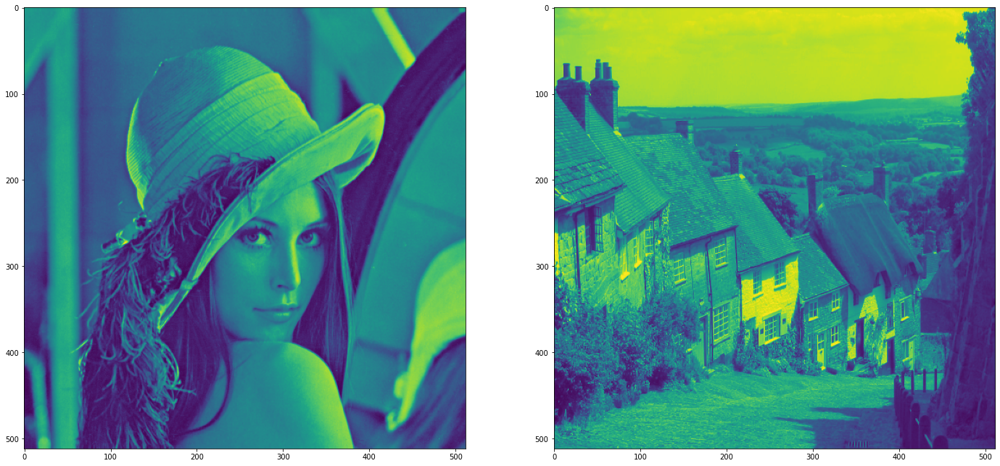

In [17]:
lena=cv2.imread('lena.tif',0).astype(np.float64)
lena=cv2.resize(lena,(512,512))
goldhill=cv2.imread('goldhill.jpeg',0).astype(np.float64)
goldhill=cv2.resize(goldhill,(512,512))
fig,ax=plt.subplots(1,2,figsize=(24,20))
ax[0].imshow(lena)
ax[1].imshow(goldhill)

### Embedding 1 bit per block equavilant to 2 pesudo random sequence per block

#### Host image Payload

In [18]:
payload =int(getHostImagePayLoadInBits(lena.shape,(8,8),1))
print (payload)

64


#### Generating watermark

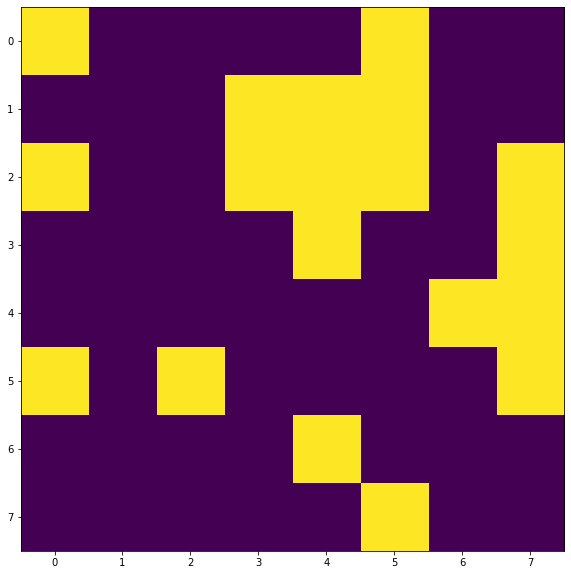

In [19]:
watermark_width=int(payload**.5)
watermark = cv2.resize(lena, (watermark_width,watermark_width) )
watermark = img2binary(watermark)
plt.figure(figsize=(12,10)).add_subplot().imshow(watermark)

#### Embedding the water mark above in GoldHill and Lena Images

#### There is compromise between percent_high_freq_coeffs and min_norm_corr and PSNR of the resulted image
#### the greater the two forst arguemnts are the better robustness we get but the resulted image after embedding deteriorate in terms of PSNR

Lena PSNR: 42.45dB
GoldHill PSNR: 42.44dB


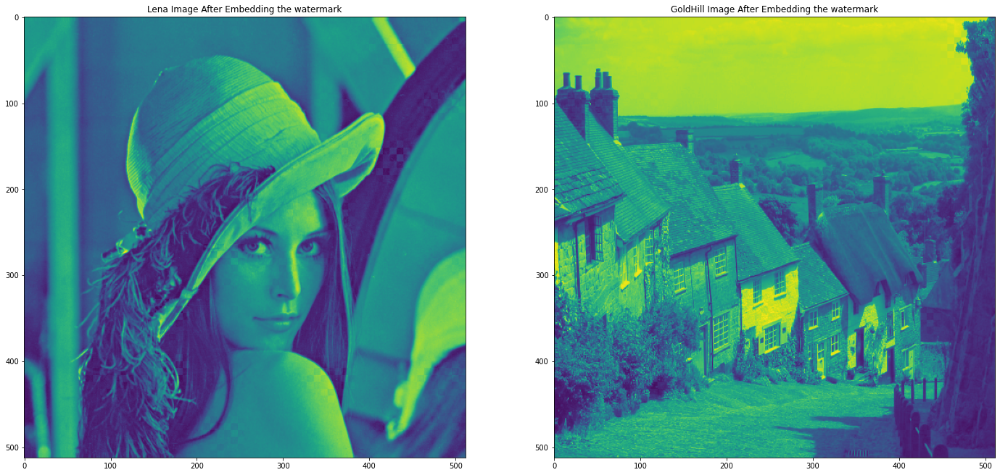

In [20]:
# Arguments to change
password="javid"
n_bits=1
percent_high_freq_coeffs=.12
block_size=(8,8)
min_norm_corr=.6

lena_embedded=embedWatermark(lena,watermark=watermark.astype(int),password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size,min_norm_corr=min_norm_corr)
goldhill_embedded=embedWatermark(goldhill,watermark=watermark.astype(int),password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size,min_norm_corr=min_norm_corr)
fig,ax=plt.subplots(1,2,figsize=(24,20))
ax[0].imshow(lena_embedded)
ax[0].set(title="Lena Image After Embedding the watermark")
ax[1].imshow(goldhill_embedded)
ax[1].set(title="GoldHill Image After Embedding the watermark")
lena_embedded_psnr=cv2.PSNR(lena_embedded,lena)
print ("Lena PSNR:",str(round(lena_embedded_psnr,2)) +'dB')

goldhill_embedded_psnr=cv2.PSNR(goldhill_embedded,goldhill)
print ("GoldHill PSNR:",str(round(goldhill_embedded_psnr,2))+'dB')

#### Extracting the watermark using wrong password

Lena RMSE: 0.84
Lena Bit Error: 45


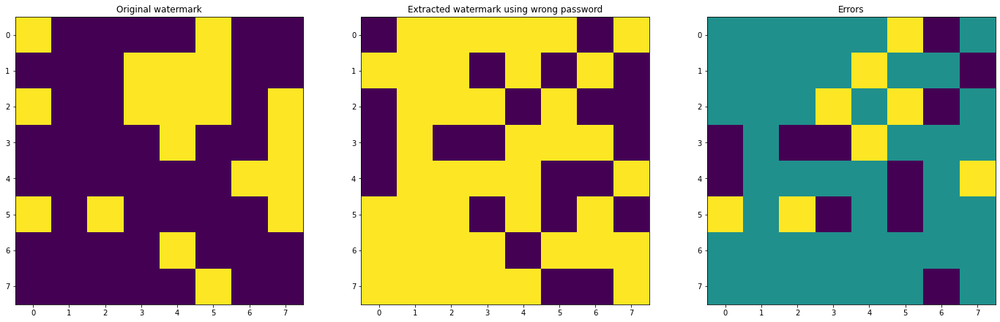

In [21]:
# Arguments to change
password="usingWrongPassword"


lena_watermark_extracted=extractWaterMark(lena_embedded,password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size)
lena_watermark_extracted=lena_watermark_extracted.reshape(watermark_width,watermark_width).astype(np.int)
fig,ax=plt.subplots(1,3,figsize=(24,20))
ax[0].imshow(watermark)
ax[0].set(title="Original watermark")
ax[1].imshow(lena_watermark_extracted)
ax[1].set(title="Extracted watermark using wrong password")
ax[2].imshow(lena_watermark_extracted+watermark)
ax[2].set(title="Errors")
lena_watermark_extracted_rmse=rmse(watermark,lena_watermark_extracted)
print ("Lena RMSE:" ,round(lena_watermark_extracted_rmse,2))
lena_watermark_extracted_bit_error=bitError(lena_watermark_extracted,watermark)
print ("Lena Bit Error:" ,round(lena_watermark_extracted_bit_error,2))

#### Extracting the watermark using correct password

Lena RMSE: 0.31
Lena Bit Error: 6


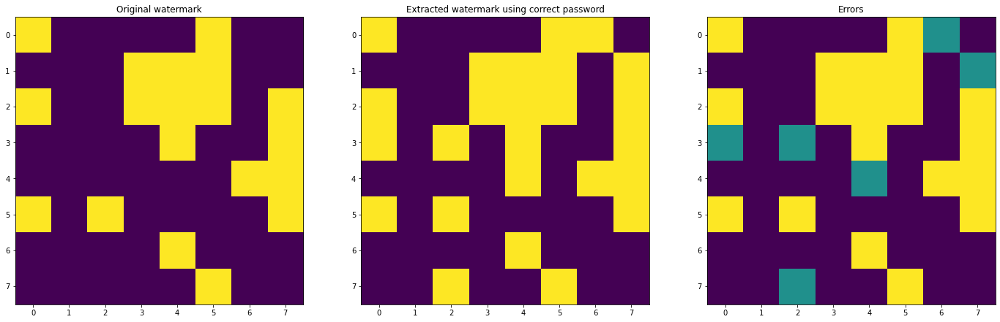

In [22]:
# Arguments to change
password="javid"


lena_watermark_extracted=extractWaterMark(lena_embedded,password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size)
lena_watermark_extracted=lena_watermark_extracted.reshape(watermark_width,watermark_width).astype(np.int)
fig,ax=plt.subplots(1,3,figsize=(24,20))
ax[0].imshow(watermark)
ax[0].set(title="Original watermark")
ax[1].imshow(lena_watermark_extracted)
ax[1].set(title="Extracted watermark using correct password")
ax[2].imshow(lena_watermark_extracted+watermark)
ax[2].set(title="Errors")
lena_watermark_extracted_rmse=rmse(watermark,lena_watermark_extracted)
print ("Lena RMSE:" ,round(lena_watermark_extracted_rmse,2))
lena_watermark_extracted_bit_error=bitError(lena_watermark_extracted,watermark)
print ("Lena Bit Error:" ,round(lena_watermark_extracted_bit_error,2))

#### Attacking the watermakred image using Gaussian Blur

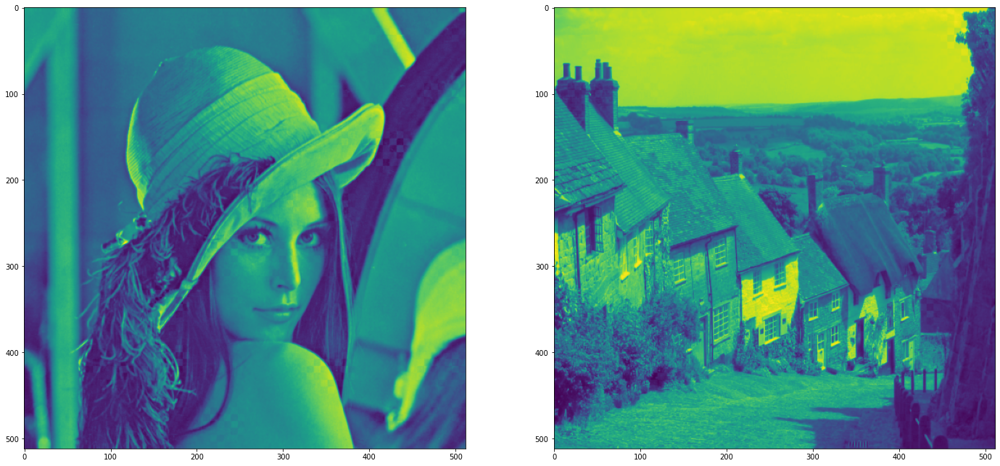

In [23]:
sigma=.5
lena_attacked_gaussian_blur=cv2.GaussianBlur(lena_embedded,(0,0),sigmaX=sigma)
goldhill_attacked_gaussian_blur=cv2.GaussianBlur(goldhill_embedded,(0,0),sigmaX=sigma)

fig,ax=plt.subplots(1,2,figsize=(24,20))
ax[0].imshow(lena_attacked_gaussian_blur)
ax[1].imshow(goldhill_attacked_gaussian_blur)

#### Extracting the watermark using attacked image

Lena RMSE: 0.33
Lena Bit Error: 7
GoldHill RMSE: 0.22
GoldHill Bit Error: 3


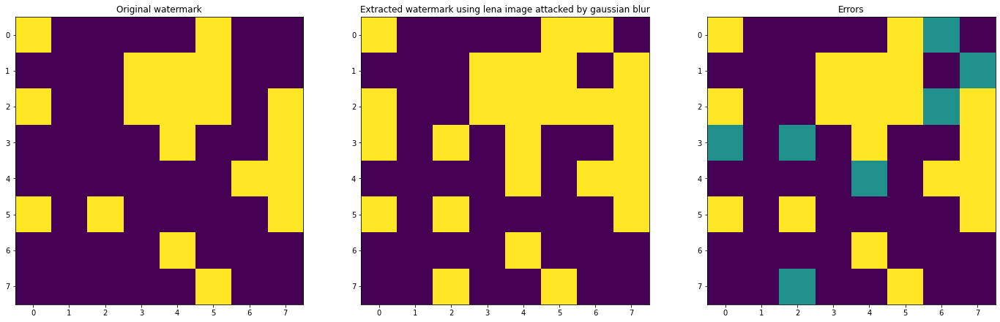

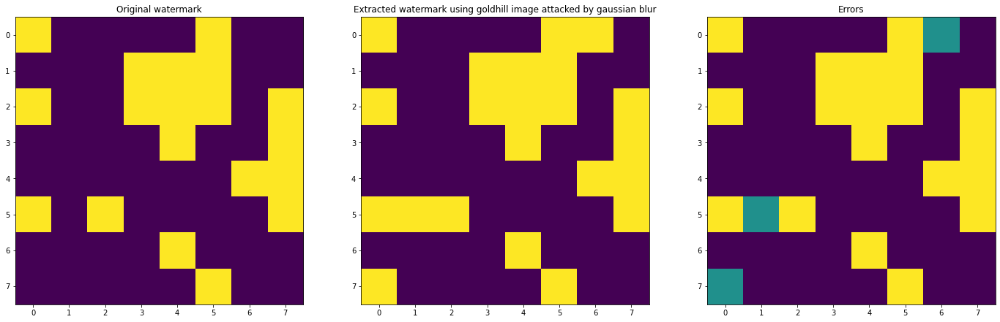

In [24]:
# Arguments to change
# password="javid"
# n_bits=1
# percent_high_freq_coeffs=.4
# block_size=(8,8)
# min_norm_corr=.7

# Lena Image
lena_watermark_extracted=extractWaterMark(lena_attacked_gaussian_blur,password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size)
lena_watermark_extracted=lena_watermark_extracted.reshape(watermark_width,watermark_width).astype(np.int)
fig,ax=plt.subplots(1,3,figsize=(24,20))
ax[0].imshow(watermark)
ax[0].set(title="Original watermark")
ax[1].imshow(lena_watermark_extracted)
ax[1].set(title="Extracted watermark using lena image attacked by gaussian blur")
ax[2].imshow(lena_watermark_extracted+watermark)
ax[2].set(title="Errors")
lena_watermark_extracted_rmse=rmse(watermark,lena_watermark_extracted)
print ("Lena RMSE:" ,round(lena_watermark_extracted_rmse,2))
lena_watermark_extracted_bit_error=bitError(lena_watermark_extracted,watermark)
print ("Lena Bit Error:" ,round(lena_watermark_extracted_bit_error,2))

# GoldHill Image
goldhill_watermark_extracted=extractWaterMark(goldhill_attacked_gaussian_blur,password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size)
goldhill_watermark_extracted=goldhill_watermark_extracted.reshape(watermark_width,watermark_width).astype(np.int)
fig,ax=plt.subplots(1,3,figsize=(24,20))
ax[0].imshow(watermark)
ax[0].set(title="Original watermark")
ax[1].imshow(goldhill_watermark_extracted)
ax[1].set(title="Extracted watermark using goldhill image attacked by gaussian blur")
ax[2].imshow(goldhill_watermark_extracted+watermark)
ax[2].set(title="Errors")
goldhill_watermark_extracted_rmse=rmse(watermark,goldhill_watermark_extracted)
print ("GoldHill RMSE:" ,round(goldhill_watermark_extracted_rmse,2))
goldhill_watermark_extracted_bit_error=bitError(goldhill_watermark_extracted,watermark)
print ("GoldHill Bit Error:" ,round(goldhill_watermark_extracted_bit_error,2))

### Embedding 2 bit per block equavilant to 4 pesudo random sequence per block

#### Host image Payload

In [25]:
payload =int(getHostImagePayLoadInBits(lena.shape,(8,8),2))
print (payload)

128


#### Generating watermark

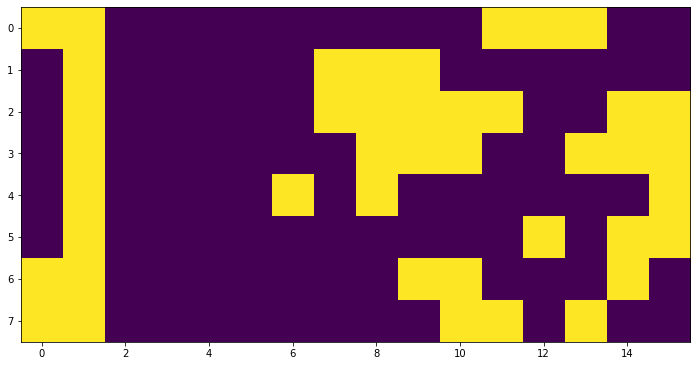

In [26]:
watermark_width=int((payload/2)**.5)
watermark = cv2.resize(lena, (2*watermark_width,watermark_width) )
watermark = img2binary(watermark)
plt.figure(figsize=(12,10)).add_subplot().imshow(watermark)

#### Embedding the water mark above in GoldHill and Lena Images

#### There is compromise between percent_high_freq_coeffs and min_norm_corr and PSNR of the resulted image
#### the greater the two forst arguemnts are the better robustness we get but the resulted image after embedding deteriorate in terms of PSNR

Lena PSNR: 42.4dB
GoldHill PSNR: 44.25dB


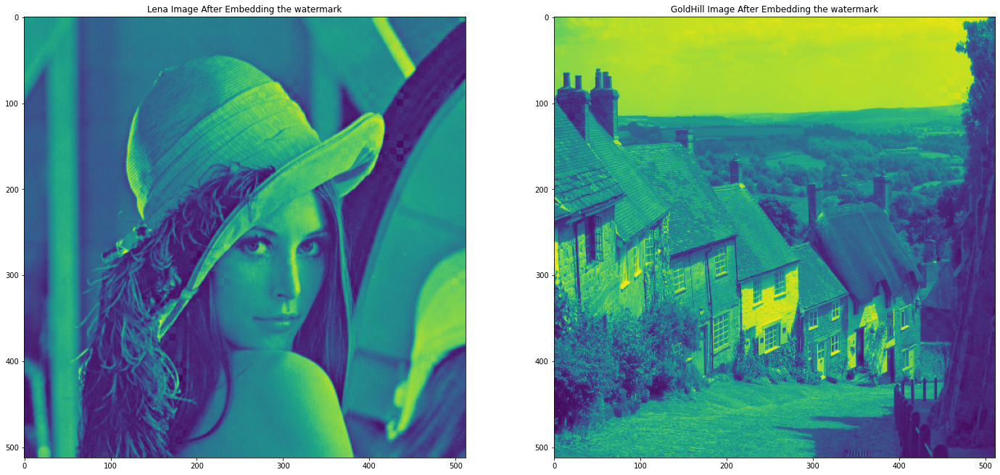

In [27]:
# Arguments to change
password="javid"
n_bits=2
percent_high_freq_coeffs=.12
block_size=(8,8)
min_norm_corr=.6

lena_embedded=embedWatermark(lena,watermark=watermark.astype(int),password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size,min_norm_corr=min_norm_corr)
goldhill_embedded=embedWatermark(goldhill,watermark=watermark.astype(int),password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size,min_norm_corr=min_norm_corr)
fig,ax=plt.subplots(1,2,figsize=(24,20))
ax[0].imshow(lena_embedded)
ax[0].set(title="Lena Image After Embedding the watermark")
ax[1].imshow(goldhill_embedded)
ax[1].set(title="GoldHill Image After Embedding the watermark")
lena_embedded_psnr=cv2.PSNR(lena_embedded,lena)
print ("Lena PSNR:",str(round(lena_embedded_psnr,2)) +'dB')

goldhill_embedded_psnr=cv2.PSNR(goldhill_embedded,goldhill)
print ("GoldHill PSNR:",str(round(goldhill_embedded_psnr,2))+'dB')

#### Extracting the watermark using wrong password for Lena image

Lena RMSE: 0.76
Lena Bit Error: 73


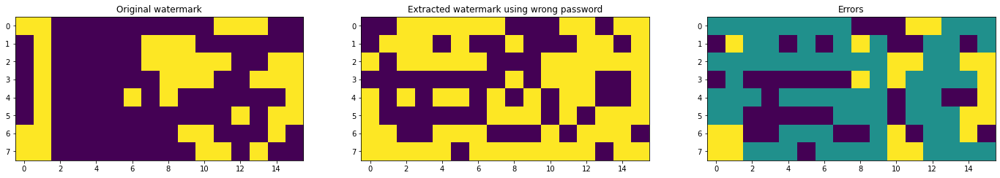

In [28]:
# Arguments to change
password="usingWrongPassword"


lena_watermark_extracted=extractWaterMark(lena_embedded,password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size)
lena_watermark_extracted=lena_watermark_extracted.reshape(watermark_width,2*watermark_width).astype(np.int)
fig,ax=plt.subplots(1,3,figsize=(24,20))
ax[0].imshow(watermark)
ax[0].set(title="Original watermark")
ax[1].imshow(lena_watermark_extracted)
ax[1].set(title="Extracted watermark using wrong password")
ax[2].imshow(lena_watermark_extracted+watermark)
ax[2].set(title="Errors")
lena_watermark_extracted_rmse=rmse(watermark,lena_watermark_extracted)
print ("Lena RMSE:" ,round(lena_watermark_extracted_rmse,2))
lena_watermark_extracted_bit_error=bitError(lena_watermark_extracted,watermark)
print ("Lena Bit Error:" ,round(lena_watermark_extracted_bit_error,2))

#### Extracting the watermark using correct password for Lena Image

Lena RMSE: 0.29
Lana Bit Error: 11


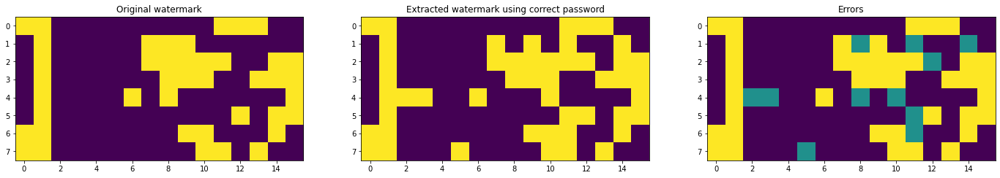

In [29]:
# Arguments to change
password="javid"


lena_watermark_extracted=extractWaterMark(lena_embedded,password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size)
lena_watermark_extracted=lena_watermark_extracted.reshape(watermark_width,2*watermark_width).astype(np.int)
fig,ax=plt.subplots(1,3,figsize=(24,20))
ax[0].imshow(watermark)
ax[0].set(title="Original watermark")
ax[1].imshow(lena_watermark_extracted)
ax[1].set(title="Extracted watermark using correct password")
ax[2].imshow(lena_watermark_extracted+watermark)
ax[2].set(title="Errors")

lena_watermark_extracted_rmse=rmse(watermark,lena_watermark_extracted)
print ("Lena RMSE:" ,round(lena_watermark_extracted_rmse,2))
lena_watermark_extracted_bit_error=bitError(lena_watermark_extracted,watermark)
print ("Lana Bit Error:" ,round(lena_watermark_extracted_bit_error,2))

#### Attacking the watermakred image using Gaussian Blur

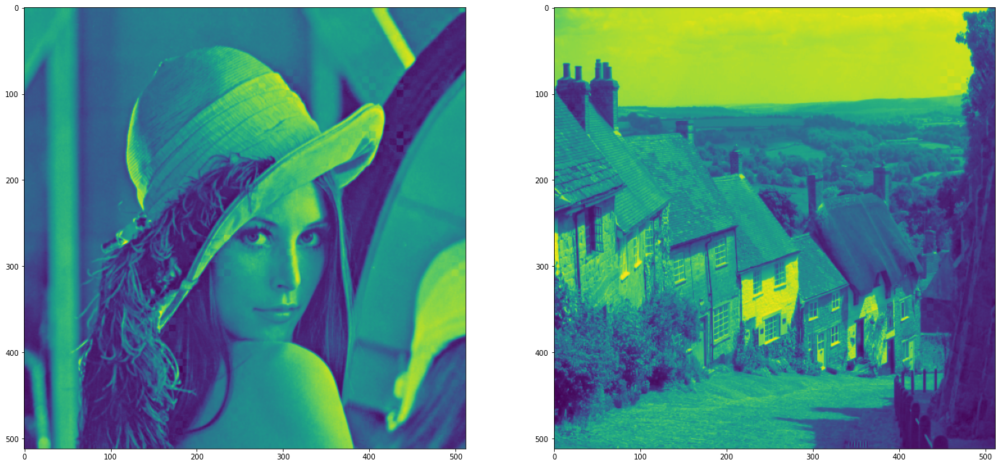

In [30]:
sigma=.5
lena_attacked_gaussian_blur=cv2.GaussianBlur(lena_embedded,(0,0),sigmaX=sigma)
goldhill_attacked_gaussian_blur=cv2.GaussianBlur(goldhill_embedded,(0,0),sigmaX=sigma)

fig,ax=plt.subplots(1,2,figsize=(24,20))
ax[0].imshow(lena_attacked_gaussian_blur)
ax[1].imshow(goldhill_attacked_gaussian_blur)

#### Extracting the watermark using attacked image

Lena RMSE: 0.36
Lena Error: 17
GoldHill RMSE: 0.4
GoldHill Bit Error: 20


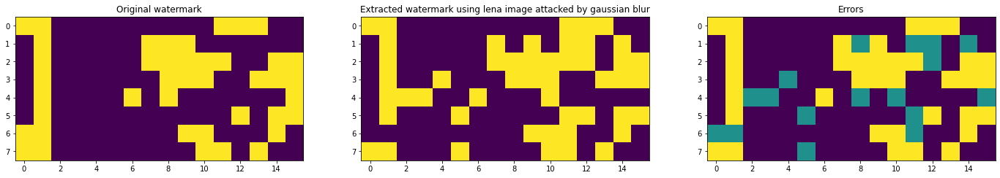

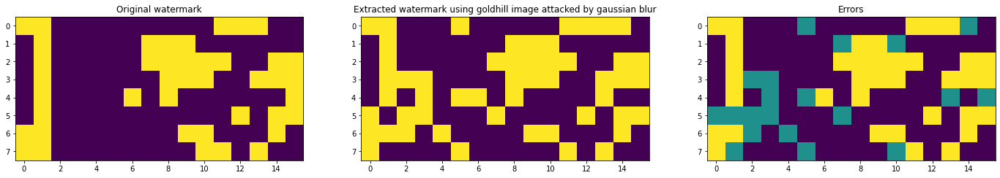

In [31]:
# Arguments to change
# password="javid"
# n_bits=1
# percent_high_freq_coeffs=.4
# block_size=(8,8)
# min_norm_corr=.7

# Lena Image
lena_watermark_extracted=extractWaterMark(lena_attacked_gaussian_blur,password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size)
lena_watermark_extracted=lena_watermark_extracted.reshape(watermark_width,2*watermark_width).astype(np.int)
fig,ax=plt.subplots(1,3,figsize=(24,20))
ax[0].imshow(watermark)
ax[0].set(title="Original watermark")
ax[1].imshow(lena_watermark_extracted)
ax[1].set(title="Extracted watermark using lena image attacked by gaussian blur")
ax[2].imshow(lena_watermark_extracted+watermark)
ax[2].set(title="Errors")

lena_watermark_extracted_rmse=rmse(watermark,lena_watermark_extracted)
print ("Lena RMSE:" ,round(lena_watermark_extracted_rmse,2))
lena_watermark_extracted_bit_error=bitError(lena_watermark_extracted,watermark)
print ("Lena Error:" ,round(lena_watermark_extracted_bit_error,2))

# GoldHill Image
goldhill_watermark_extracted=extractWaterMark(goldhill_attacked_gaussian_blur,password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size)
goldhill_watermark_extracted=goldhill_watermark_extracted.reshape(watermark_width,2*watermark_width).astype(np.int)
fig,ax=plt.subplots(1,3,figsize=(24,20))
ax[0].imshow(watermark)
ax[0].set(title="Original watermark")
ax[1].imshow(goldhill_watermark_extracted )
ax[1].set(title="Extracted watermark using goldhill image attacked by gaussian blur")
ax[2].imshow(goldhill_watermark_extracted + watermark)
ax[2].set(title="Errors")

goldhill_watermark_extracted_rmse=rmse(watermark,goldhill_watermark_extracted)
print ("GoldHill RMSE:" ,round(goldhill_watermark_extracted_rmse,2))
goldhill_watermark_extracted_bit_error=bitError(goldhill_watermark_extracted,watermark)
print ("GoldHill Bit Error:" ,round(goldhill_watermark_extracted_bit_error,2))

### Embedding 4 bit per block equavilant to 16 pesudo random sequence per block

#### Host image Payload

In [32]:
payload =int(getHostImagePayLoadInBits(lena.shape,(8,8),4))
print (payload)

256


#### Generating watermark

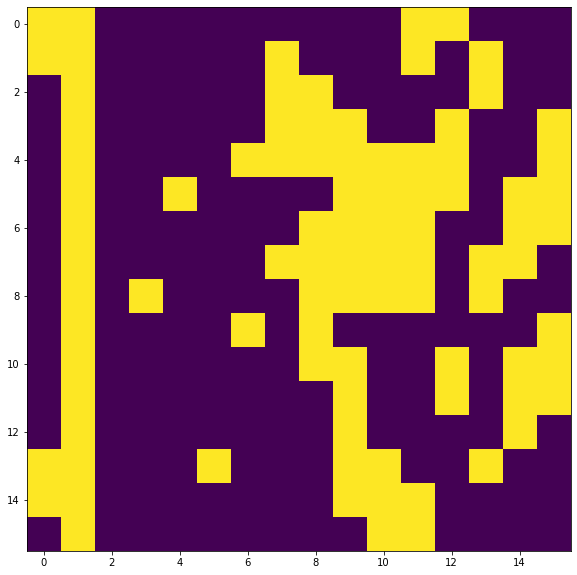

In [33]:
watermark_width=int(payload**.5)
watermark = cv2.resize(lena, (watermark_width,watermark_width) )
watermark = img2binary(watermark)
plt.figure(figsize=(12,10)).add_subplot().imshow(watermark)

#### Embedding the water mark above in GoldHill and Lena Images

#### There is compromise between percent_high_freq_coeffs and min_norm_corr and PSNR of the resulted image
#### the greater the two forst arguemnts are the better robustness we get but the resulted image after embedding deteriorate in terms of PSNR

Lena PSNR: 39.65dB
GoldHill PSNR: 41.15dB


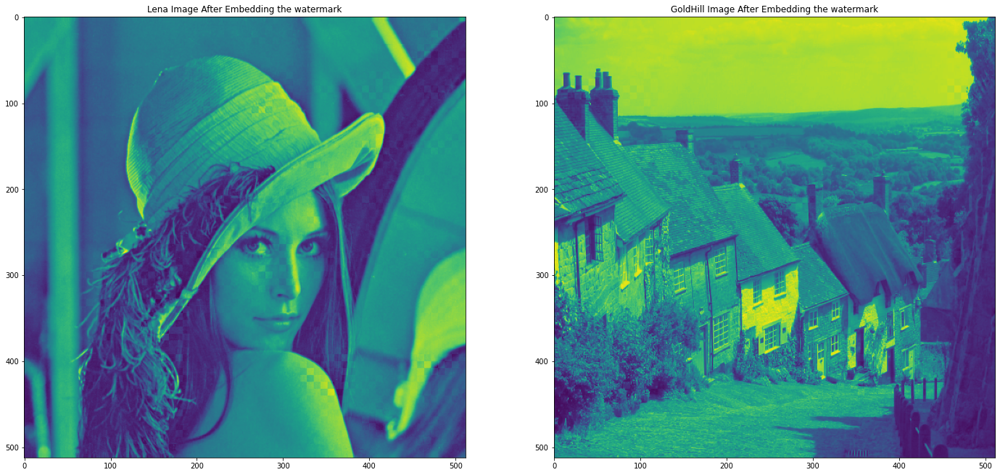

In [34]:
# Arguments to change
password="javid"
n_bits=4
percent_high_freq_coeffs=.2
block_size=(8,8)
min_norm_corr=.6

lena_embedded=embedWatermark(lena,watermark=watermark.astype(int),password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size,min_norm_corr=min_norm_corr)
goldhill_embedded=embedWatermark(goldhill,watermark=watermark.astype(int),password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size,min_norm_corr=min_norm_corr)
fig,ax=plt.subplots(1,2,figsize=(24,20))
ax[0].imshow(lena_embedded)
ax[0].set(title="Lena Image After Embedding the watermark")
ax[1].imshow(goldhill_embedded)
ax[1].set(title="GoldHill Image After Embedding the watermark")
lena_embedded_psnr=cv2.PSNR(lena_embedded,lena)
print ("Lena PSNR:",str(round(lena_embedded_psnr,2)) +'dB')

goldhill_embedded_psnr=cv2.PSNR(goldhill_embedded,goldhill)
print ("GoldHill PSNR:",str(round(goldhill_embedded_psnr,2))+'dB')

#### Extracting the watermark using wrong password for Lena image

Lena RMSE: 0.71
Lenta Bit Error: 130


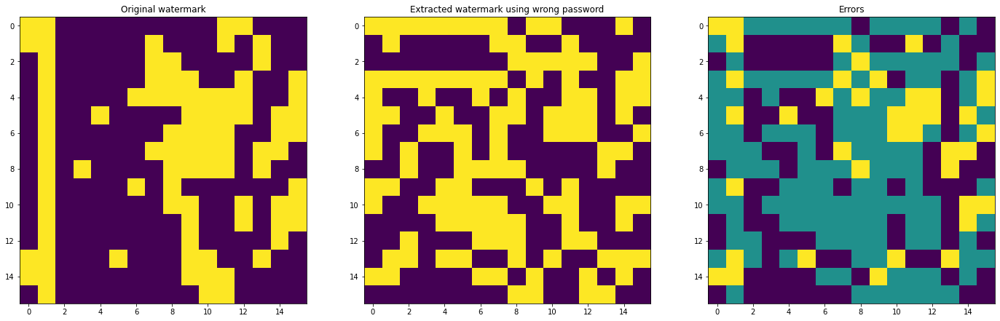

In [35]:
# Arguments to change
password="usingWrongPassword"


lena_watermark_extracted=extractWaterMark(lena_embedded,password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size)
lena_watermark_extracted=lena_watermark_extracted.reshape(watermark_width,watermark_width).astype(np.int)
fig,ax=plt.subplots(1,3,figsize=(24,20))
ax[0].imshow(watermark)
ax[0].set(title="Original watermark")
ax[1].imshow(lena_watermark_extracted)
ax[1].set(title="Extracted watermark using wrong password")
ax[2].imshow(lena_watermark_extracted+watermark)
ax[2].set(title="Errors")
lena_watermark_extracted_rmse=rmse(watermark,lena_watermark_extracted)
print ("Lena RMSE:" ,round(lena_watermark_extracted_rmse,2))
lena_watermark_extracted_bit_error=bitError(lena_watermark_extracted,watermark)
print ("Lenta Bit Error:" ,round(lena_watermark_extracted_bit_error,2))

#### Extracting the watermark using correct password for Lena image

Lena RMSE: 0.41
Lena Bit Error: 43


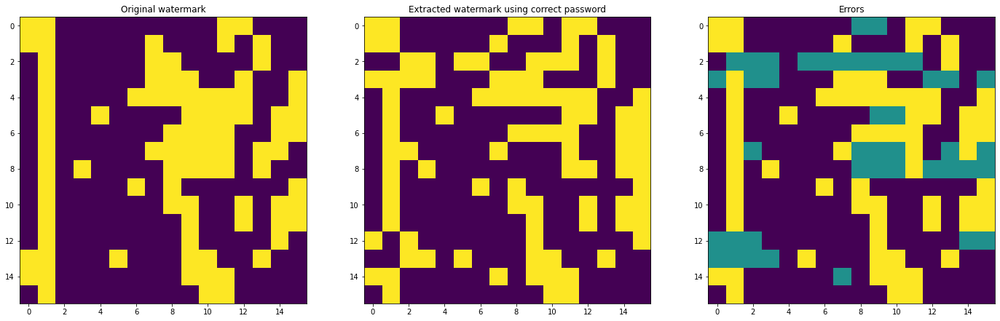

In [36]:
# Arguments to change
password="javid"


lena_watermark_extracted=extractWaterMark(lena_embedded,password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size)
lena_watermark_extracted=lena_watermark_extracted.reshape(watermark_width,watermark_width).astype(np.int)
fig,ax=plt.subplots(1,3,figsize=(24,20))
ax[0].imshow(watermark)
ax[0].set(title="Original watermark")
ax[1].imshow(lena_watermark_extracted)
ax[1].set(title="Extracted watermark using correct password")
ax[2].imshow(lena_watermark_extracted+watermark)
ax[2].set(title="Errors")

lena_watermark_extracted_rmse=rmse(watermark,lena_watermark_extracted)
print ("Lena RMSE:" ,round(lena_watermark_extracted_rmse,2))
lena_watermark_extracted_bit_error=bitError(lena_watermark_extracted,watermark)
print ("Lena Bit Error:" ,round(lena_watermark_extracted_bit_error,2))

#### Attacking the watermakred image using Gaussian Blur

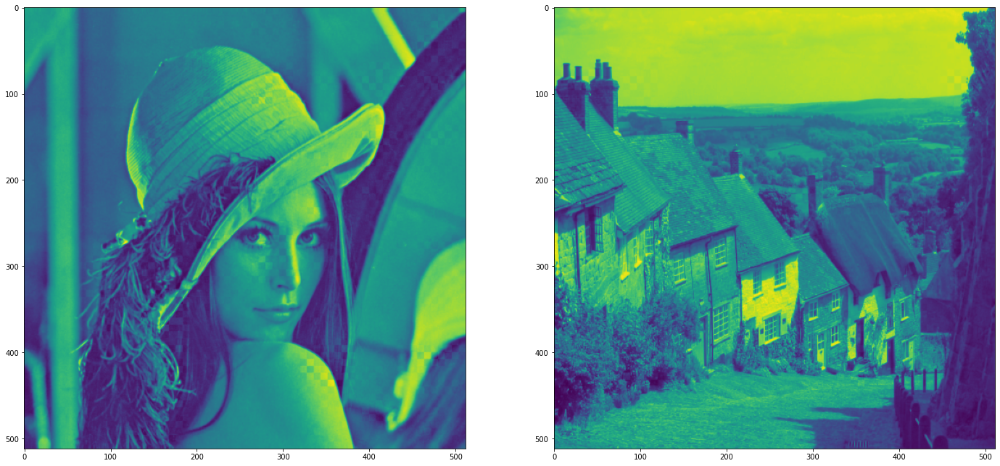

In [37]:
sigma=.5
lena_attacked_gaussian_blur=cv2.GaussianBlur(lena_embedded,(0,0),sigmaX=sigma)
goldhill_attacked_gaussian_blur=cv2.GaussianBlur(goldhill_embedded,(0,0),sigmaX=sigma)

fig,ax=plt.subplots(1,2,figsize=(24,20))
ax[0].imshow(lena_attacked_gaussian_blur)
ax[1].imshow(goldhill_attacked_gaussian_blur)

#### Extracting the watermark using attacked image

Lena RMSE: 0.47
Lena Bit Error: 56
GoldHill RMSE: 0.38
GoldHill Bit Error: 37


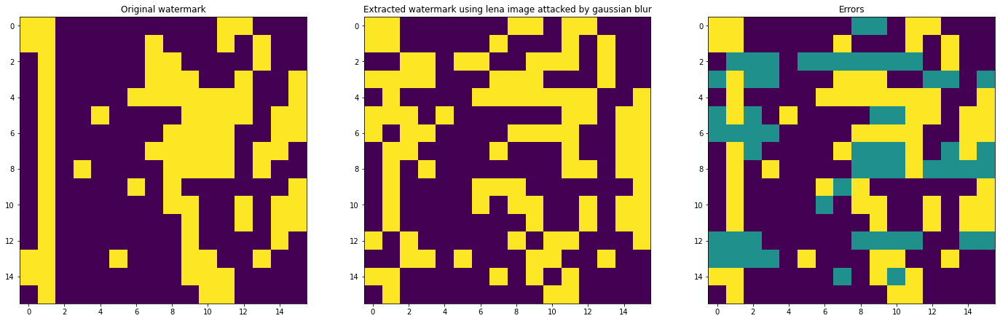

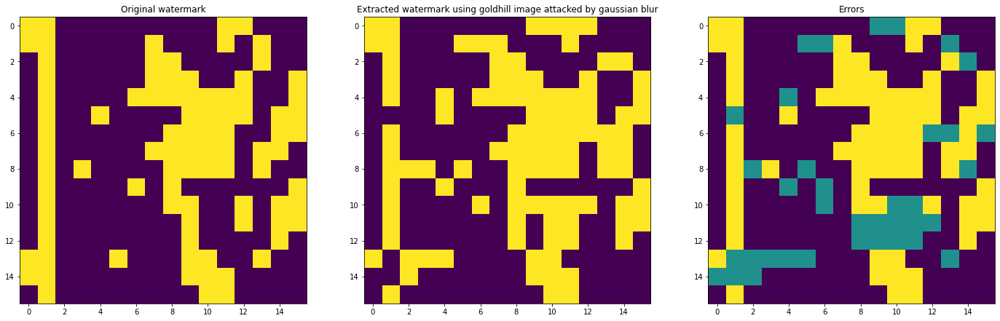

In [38]:
# Arguments to change
# password="javid"
# n_bits=1
# percent_high_freq_coeffs=.4
# block_size=(8,8)
# min_norm_corr=.7

# Lena Image
lena_watermark_extracted=extractWaterMark(lena_attacked_gaussian_blur,password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size)
lena_watermark_extracted=lena_watermark_extracted.reshape(watermark_width,watermark_width).astype(np.int)
fig,ax=plt.subplots(1,3,figsize=(24,20))
ax[0].imshow(watermark)
ax[0].set(title="Original watermark")
ax[1].imshow(lena_watermark_extracted)
ax[1].set(title="Extracted watermark using lena image attacked by gaussian blur")
ax[2].imshow(lena_watermark_extracted+watermark)
ax[2].set(title="Errors")

lena_watermark_extracted_rmse=rmse(watermark,lena_watermark_extracted)
print ("Lena RMSE:" ,round(lena_watermark_extracted_rmse,2))
lena_watermark_extracted_bit_error=bitError(lena_watermark_extracted,watermark)
print ("Lena Bit Error:" ,round(lena_watermark_extracted_bit_error,2))

# GoldHill Image
goldhill_watermark_extracted=extractWaterMark(goldhill_attacked_gaussian_blur,password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size)
goldhill_watermark_extracted=goldhill_watermark_extracted.reshape(watermark_width,watermark_width).astype(np.int)
fig,ax=plt.subplots(1,3,figsize=(24,20))
ax[0].imshow(watermark)
ax[0].set(title="Original watermark")
ax[1].imshow(goldhill_watermark_extracted )
ax[1].set(title="Extracted watermark using goldhill image attacked by gaussian blur")
ax[2].imshow(goldhill_watermark_extracted + watermark)
ax[2].set(title="Errors")

goldhill_watermark_extracted_rmse=rmse(watermark,goldhill_watermark_extracted)
print ("GoldHill RMSE:" ,round(goldhill_watermark_extracted_rmse,2))
goldhill_watermark_extracted_bit_error=bitError(goldhill_watermark_extracted,watermark)
print ("GoldHill Bit Error:" ,round(goldhill_watermark_extracted_bit_error,2))

#### The large Bit Error is due to consideration made to preserve the image quality other wise using larger 'min_norm_corr' and 'percent_high_freq_coeffs' can lead to zero Bit Error but lose of quality is inevitable

### Furthur Analysis

#### Using Lena image and 4 bits for embedding  we would try to further analyse the relation between different parameters uesd here

#### Loading Lena Image

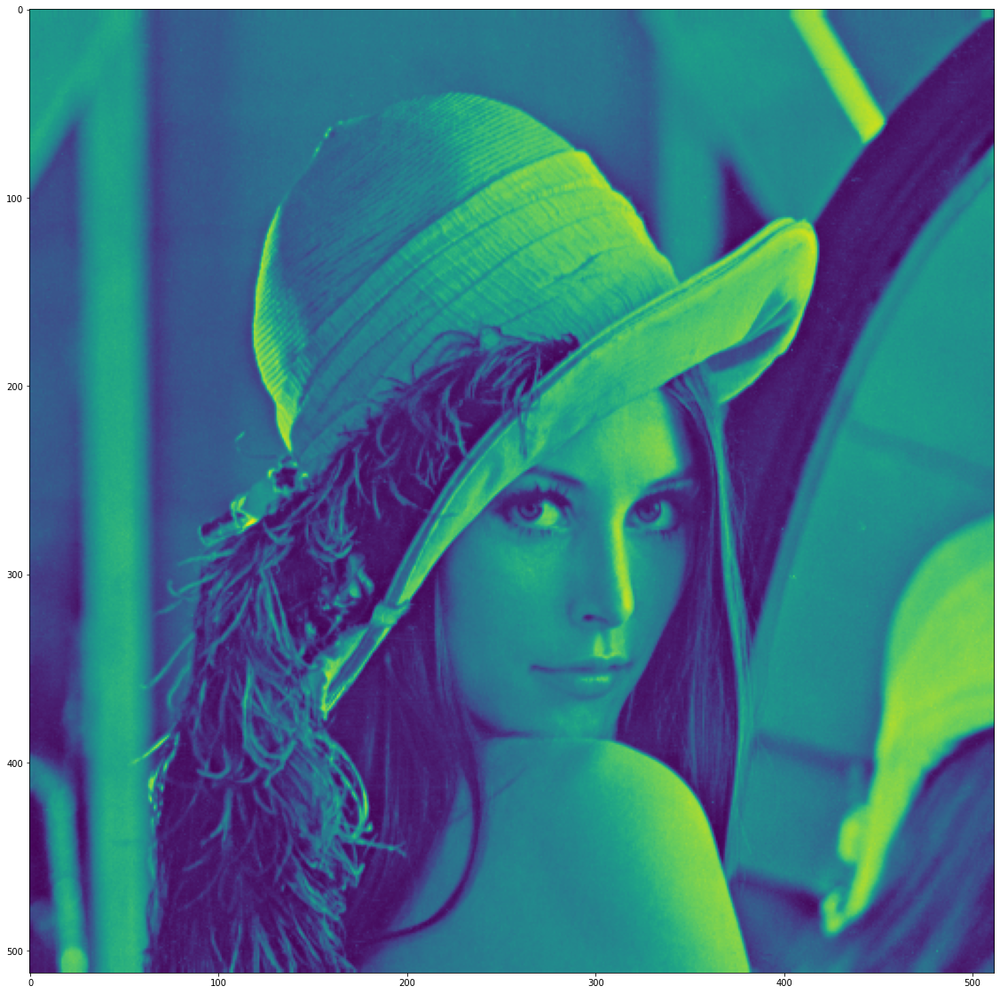

In [39]:
lena=cv2.imread('lena.tif',0).astype(np.float64)
lena=cv2.resize(lena,(512,512))
plt.figure(figsize=(24,20)).add_subplot().imshow(lena)

#### Host image Payload

In [40]:
payload =int(getHostImagePayLoadInBits(lena.shape,(8,8),4))
print (payload)

256


#### Generating watermark

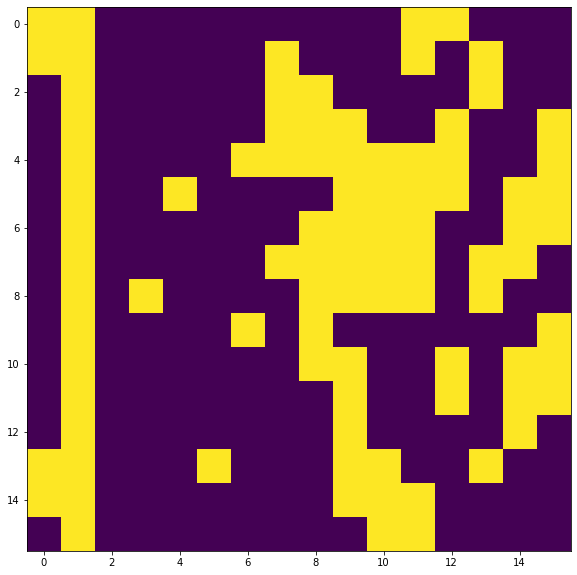

In [41]:
watermark_width=int(payload**.5)
watermark = cv2.resize(lena, (watermark_width,watermark_width) )
watermark = img2binary(watermark)
plt.figure(figsize=(12,10)).add_subplot().imshow(watermark)

#### Embedded image PSNR VS percent_high_freq_coeffs in constant min_norm_corr=.6

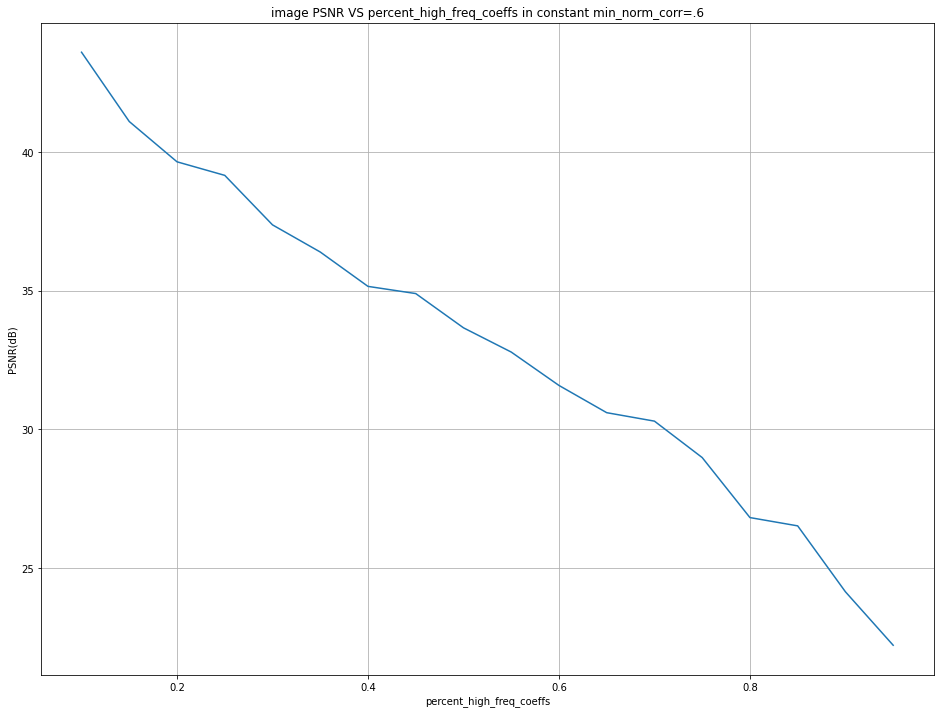

In [42]:
# Arguments to change
password="javid"
n_bits=4
percent_high_freq_coeffs=.12
block_size=(8,8)
min_norm_corr=.6

percent_high_freq_coeffs_list=np.arange(.1,1,.05)
psnr_vs_percent_high_freq_coeffs=[]

for percent_high_freq_coeffs in percent_high_freq_coeffs_list:
    lena_embedded=embedWatermark(lena,watermark=watermark.astype(int),password=password,n_bits=n_bits,percent_high_freq_coeffs=float(percent_high_freq_coeffs),block_size=block_size,min_norm_corr=min_norm_corr)
    psnr=cv2.PSNR(lena_embedded,lena)
    psnr_vs_percent_high_freq_coeffs.append(psnr)

fig,ax=plt.subplots(1,1,figsize=(16,12))
ax.grid()
ax.set(title="image PSNR VS percent_high_freq_coeffs in constant min_norm_corr=.6",Xlabel="percent_high_freq_coeffs",Ylabel="PSNR(dB)")
plt.plot(list(percent_high_freq_coeffs_list),psnr_vs_percent_high_freq_coeffs)

#### Extracted Watermark BitError VS percent_high_freq_coeffs in constant min_norm_corr=.6

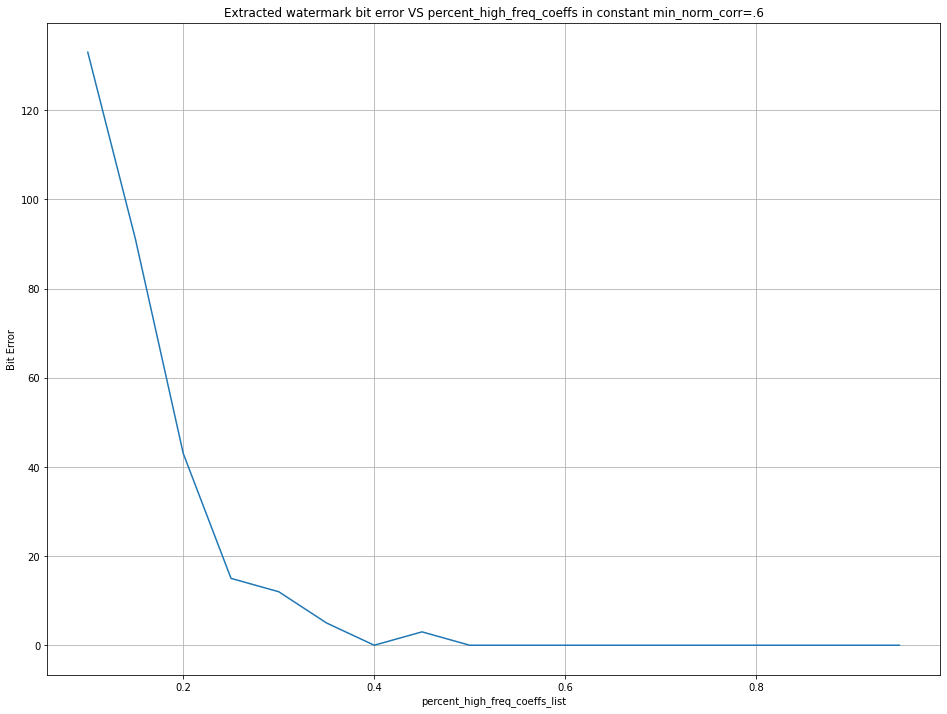

In [43]:
# Arguments to change
password="javid"
n_bits=4
percent_high_freq_coeffs=.12
block_size=(8,8)
min_norm_corr=.6

percent_high_freq_coeffs_list=np.arange(.1,1,.05)
bit_error_vs_percent_high_freq_coeffs=[]


for percent_high_freq_coeffs in percent_high_freq_coeffs_list:
    lena_embedded=embedWatermark(lena,watermark=watermark.astype(int),password=password,n_bits=n_bits,percent_high_freq_coeffs=float(percent_high_freq_coeffs),block_size=block_size,min_norm_corr=min_norm_corr)
    lena_watermark_extracted=extractWaterMark(lena_embedded,password=password,n_bits=n_bits,percent_high_freq_coeffs=float(percent_high_freq_coeffs),block_size=block_size)
    lena_watermark_extracted=lena_watermark_extracted.reshape(watermark_width,watermark_width).astype(np.int)
    bit_error=bitError(lena_watermark_extracted,watermark)
    bit_error_vs_percent_high_freq_coeffs.append(bit_error)

fig,ax=plt.subplots(1,1,figsize=(16,12))
ax.grid()
ax.set(title="Extracted watermark bit error VS percent_high_freq_coeffs in constant min_norm_corr=.6",Xlabel="percent_high_freq_coeffs_list",Ylabel="Bit Error")
plt.plot(list(percent_high_freq_coeffs_list),bit_error_vs_percent_high_freq_coeffs)

#### Embedded image PSNR VS min_norm_corr in percent_high_freq_coeffs=.12

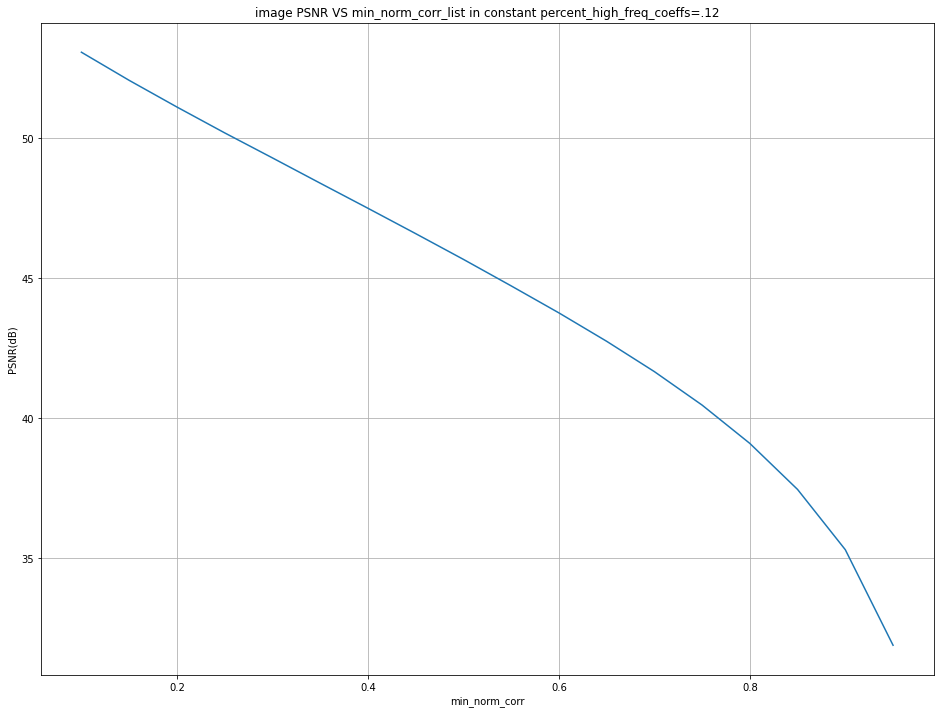

In [44]:
# Arguments to change
password="javid"
n_bits=4
percent_high_freq_coeffs=.12
block_size=(8,8)
min_norm_corr=.6


min_norm_corr_list=np.arange(.1,1,.05)
psnr_vs_min_norm_corr=[]

for min_norm_corr in min_norm_corr_list:
    lena_embedded=embedWatermark(lena,watermark=watermark.astype(int),password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size,min_norm_corr=float(min_norm_corr))
    psnr=cv2.PSNR(lena_embedded,lena)
    psnr_vs_min_norm_corr.append(psnr)

fig,ax=plt.subplots(1,1,figsize=(16,12))
ax.grid()
ax.set(title="image PSNR VS min_norm_corr_list in constant percent_high_freq_coeffs=.12",Xlabel="min_norm_corr",Ylabel="PSNR(dB)")
plt.plot(list(min_norm_corr_list),psnr_vs_min_norm_corr)

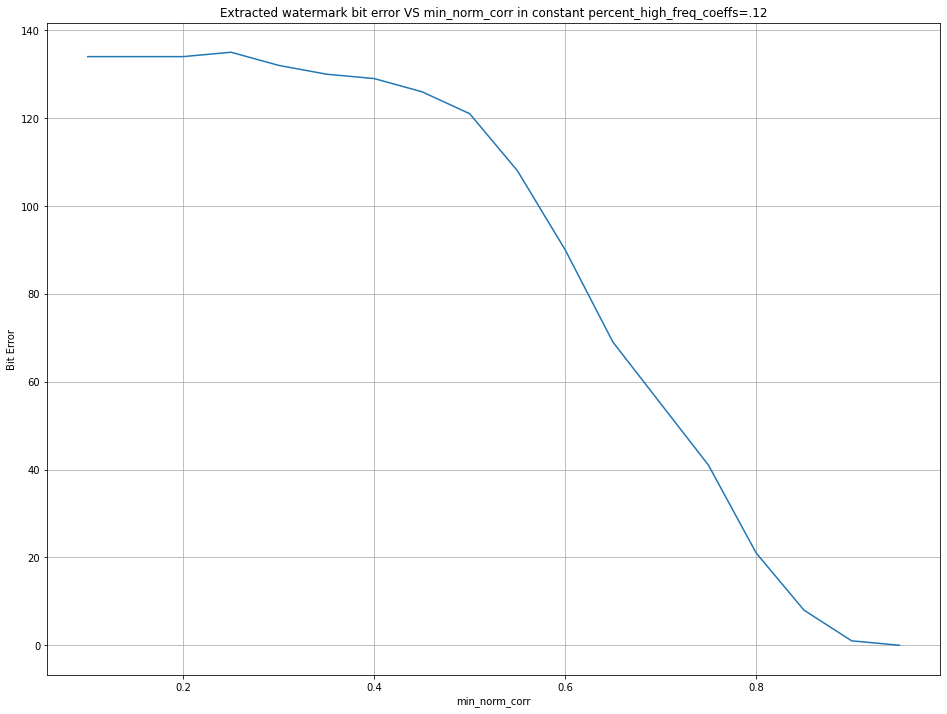

In [45]:
# Arguments to change
password="javid"
n_bits=4
percent_high_freq_coeffs=.12
block_size=(8,8)
min_norm_corr=.6

min_norm_corr_list=np.arange(.1,1,.05)
bit_error_vs_min_norm_corr=[]


for min_norm_corr in min_norm_corr_list:
    lena_embedded=embedWatermark(lena,watermark=watermark.astype(int),password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size,min_norm_corr=float(min_norm_corr))
    lena_watermark_extracted=extractWaterMark(lena_embedded,password=password,n_bits=n_bits,percent_high_freq_coeffs=percent_high_freq_coeffs,block_size=block_size)
    lena_watermark_extracted=lena_watermark_extracted.reshape(watermark_width,watermark_width).astype(np.int)
    bit_error=bitError(lena_watermark_extracted,watermark)
    bit_error_vs_min_norm_corr.append(bit_error)

fig,ax=plt.subplots(1,1,figsize=(16,12))
ax.grid()
ax.set(title="Extracted watermark bit error VS min_norm_corr in constant percent_high_freq_coeffs=.12",Xlabel="min_norm_corr",Ylabel="Bit Error")
plt.plot(list(min_norm_corr_list),bit_error_vs_min_norm_corr)

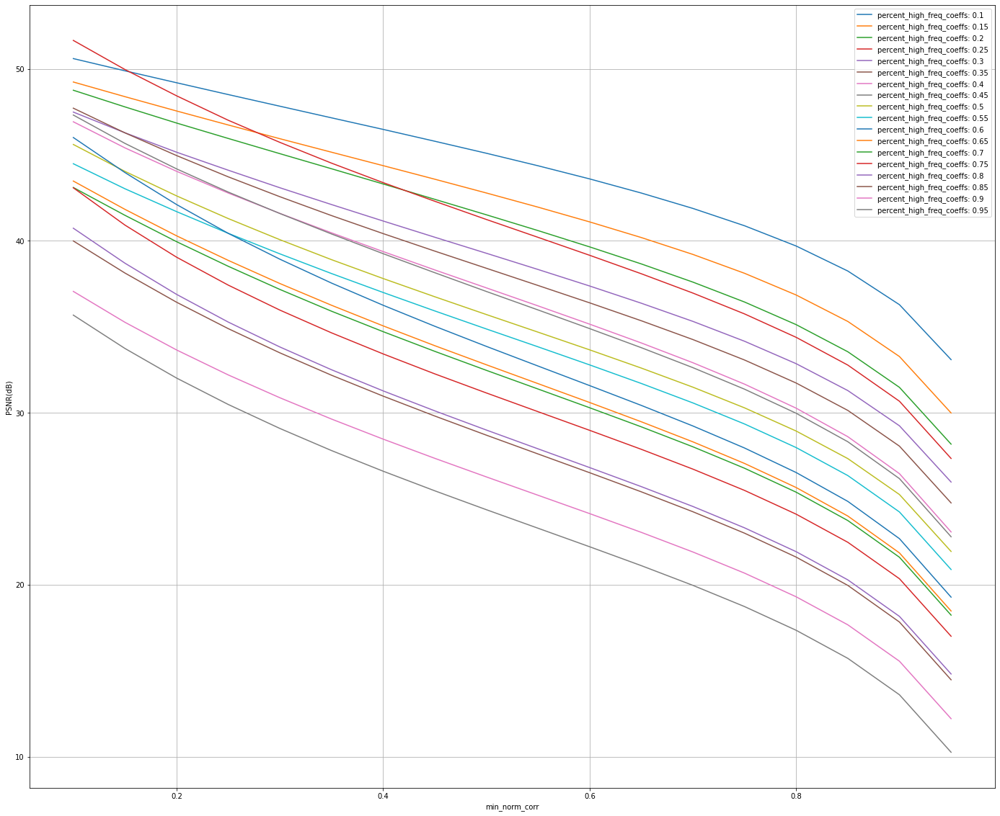

In [46]:
# Arguments to change
password="javid"
n_bits=4
percent_high_freq_coeffs=.12
block_size=(8,8)
min_norm_corr=.6

percent_high_freq_coeffs_list=np.arange(.1,1,.05)
min_norm_corr_list=np.arange(.1,1,.05)
psnr_vs_percent_high_freq_coeffs_vs_min_norm_corr=np.zeros((len(min_norm_corr_list),len(min_norm_corr_list)))
fig,ax=plt.subplots(figsize=(24,20))
for m,percent_high_freq_coeffs in enumerate(percent_high_freq_coeffs_list):
    for n ,min_norm_corr in enumerate(min_norm_corr_list):
        lena_embedded=embedWatermark(lena,watermark=watermark.astype(int),password=password,n_bits=n_bits,percent_high_freq_coeffs=float(percent_high_freq_coeffs),block_size=block_size,min_norm_corr=float(min_norm_corr))
        psnr=cv2.PSNR(lena_embedded,lena)
        psnr_vs_percent_high_freq_coeffs_vs_min_norm_corr[m,n]=psnr
    ax.plot(list(min_norm_corr_list),psnr_vs_percent_high_freq_coeffs_vs_min_norm_corr[m,:],label="percent_high_freq_coeffs: " +str(round(percent_high_freq_coeffs,2)))
ax.set(Xlabel='min_norm_corr',Ylabel='PSNR(dB)')
ax.legend()
ax.grid()

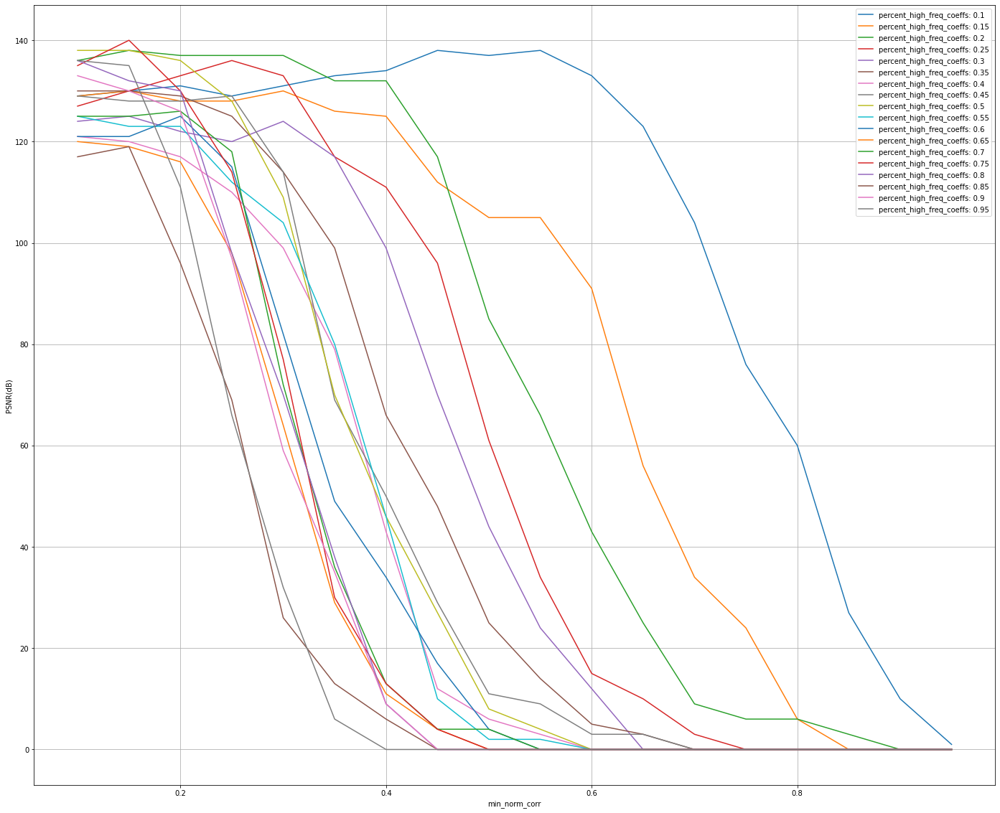

In [47]:
# Arguments to change
password="javid"
n_bits=4
percent_high_freq_coeffs=.12
block_size=(8,8)
min_norm_corr=.6

percent_high_freq_coeffs_list=np.arange(.1,1,.05)
min_norm_corr_list=np.arange(.1,1,.05)
bit_error_vs_percent_high_freq_coeffs_vs_min_norm_corr=np.zeros((len(min_norm_corr_list),len(min_norm_corr_list)))
fig,ax=plt.subplots(figsize=(24,20))
for m,percent_high_freq_coeffs in enumerate(percent_high_freq_coeffs_list):
    for n ,min_norm_corr in enumerate(min_norm_corr_list):
        lena_embedded=embedWatermark(lena,watermark=watermark.astype(int),password=password,n_bits=n_bits,percent_high_freq_coeffs=float(percent_high_freq_coeffs),block_size=block_size,min_norm_corr=float(min_norm_corr))
        lena_watermark_extracted=extractWaterMark(lena_embedded,password=password,n_bits=n_bits,percent_high_freq_coeffs=float(percent_high_freq_coeffs),block_size=block_size)
        lena_watermark_extracted=lena_watermark_extracted.reshape(watermark_width,watermark_width).astype(np.int)
        bit_error=bitError(lena_watermark_extracted,watermark)
        bit_error_vs_percent_high_freq_coeffs_vs_min_norm_corr[m,n]=bit_error
    ax.plot(list(min_norm_corr_list),bit_error_vs_percent_high_freq_coeffs_vs_min_norm_corr[m,:],label="percent_high_freq_coeffs: " +str(round(percent_high_freq_coeffs,2)))
ax.set(Xlabel='min_norm_corr',Ylabel='PSNR(dB)')
ax.legend()
ax.grid()

### As is shown in figures above we can't preserve both zero error for extraction and PSNR above 40dB at the same time

In [48]:
plt.show()

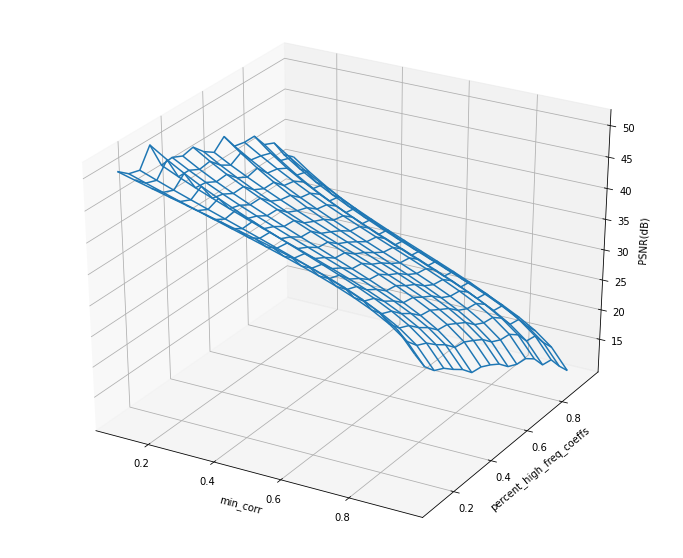

In [50]:
xs = np.arange(.1, 1, 0.05)
ys = np.arange(.1, 1,0.05)
X, Y = np.meshgrid(xs, ys)
fig=plt.figure(figsize=(12,10))
ax=fig.add_subplot(111, projection='3d')
ax.grid()
ax.set(Xlabel='min_corr',Ylabel='percent_high_freq_coeffs',Zlabel='PSNR(dB)')
# ax.set_zlim([-2 ,1])
ax.plot_wireframe(X,Y,psnr_vs_percent_high_freq_coeffs_vs_min_norm_corr)


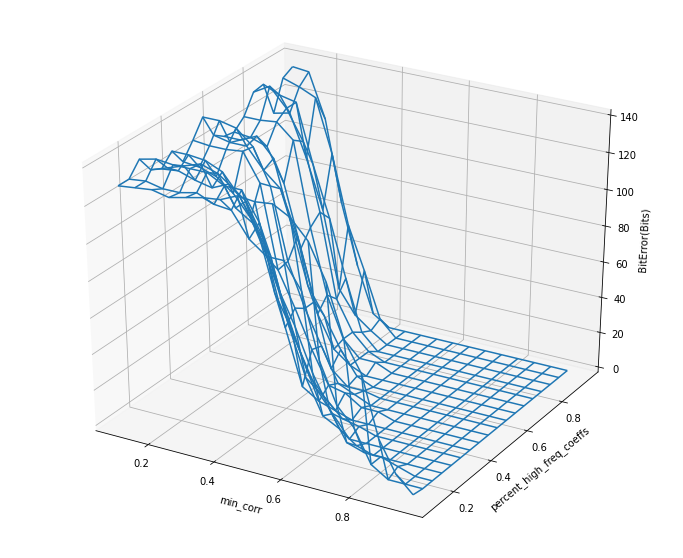

In [51]:
xs = np.arange(.1, 1, 0.05)
ys = np.arange(.1, 1,0.05)
X, Y = np.meshgrid(xs, ys)
fig=plt.figure(figsize=(12,10))
ax=fig.add_subplot(111, projection='3d')
ax.grid()
ax.set(Xlabel='min_corr',Ylabel='percent_high_freq_coeffs',Zlabel='BitError(Bits)')
# ax.set_zlim([-2 ,1])
ax.plot_wireframe(X,Y,bit_error_vs_percent_high_freq_coeffs_vs_min_norm_corr)
